In [1]:
from adjustText import adjust_text
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from pandas_profiling import ProfileReport

%matplotlib inline

# import data 

In [2]:
df_scores = pd.read_csv(os.path.join('..', 'data', '12_subject_scores.csv'))

display(df_scores.head())

display(df_scores.describe())

,国語,英語,数学,物理,化学,生物,地学,世界史,日本史,経済,地理,倫理
0,-0.394296,-0.863552,0.299784,0.052264,-0.193747,1.762086,-0.458840,-0.889665,-0.163093,-0.939310,-0.149300,-2.286900
1,-1.062188,-0.061273,-0.572619,-0.544283,-0.305108,1.988985,-0.166363,0.610966,-0.951714,1.390854,-0.226003,-0.031098
2,-0.669470,-0.751437,0.574793,-0.379771,-0.539259,-0.623499,-1.034320,0.393436,1.439274,2.218160,0.716289,-0.462702
3,0.776026,1.166164,-0.986413,-0.723857,-0.091960,-0.150870,-0.047286,-2.427921,0.433994,-1.270779,0.323981,1.406393
4,-2.212173,-0.571762,-0.842556,-0.849638,-0.280362,-1.089733,-0.836957,-0.812882,-1.702264,-0.365675,-0.113076,-2.497812


,国語,英語,数学,物理,化学,生物,地学,世界史,日本史,経済,地理,倫理
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,-0.010089,-0.042211,-0.003682,-0.051710,-0.006481,-0.036420,-0.022611,-0.041581,-0.053731,0.014815,-0.008568,-0.033251
std,0.995078,1.016360,0.999122,0.977206,1.025088,1.039087,1.029798,0.990281,1.009654,0.988610,0.982288,1.050754
min,-3.416756,-3.155252,-3.080833,-2.931218,-3.098775,-3.282151,-2.878050,-3.661941,-3.183342,-2.912544,-2.941501,-3.253023
25%,-0.700112,-0.714549,-0.675039,-0.708696,-0.718682,-0.759295,-0.742097,-0.713674,-0.761428,-0.669257,-0.693002,-0.774409
50%,0.014930,0.010007,0.002503,-0.048876,-0.040991,0.006117,-0.012499,-0.051340,-0.018274,0.019602,0.003966,-0.065331
75%,0.674855,0.636507,0.608149,0.600204,0.682366,0.656197,0.685734,0.651264,0.633814,0.667424,0.636094,0.660389
max,3.098545,2.769637,3.718981,3.092036,3.295149,3.023081,2.991380,2.850458,3.051229,3.296786,3.522907,2.961954


In [3]:
profile = ProfileReport(df_scores, title='Pandas Profiling Report', html={'style':{'full_width':True}})

In [4]:
profile

In [5]:
mapper_ja2en = {
    '国語': 'Japanese',
    '英語': 'English',
    '数学': 'Mathmatics',
    '物理': 'Physics',
    '化学': 'Chemistry',
    '生物': 'Biology',
    '地学': 'Earth',
    '世界史': 'World history',
    '日本史': 'Japanese history',
    '経済': 'Economics',
    '地理': 'Geography',
    '倫理': 'Ethics',
}

# apply qualitization

In [6]:
df_corr = df_scores.corr()

df_corr

,国語,英語,数学,物理,化学,生物,地学,世界史,日本史,経済,地理,倫理
国語,1.000000,0.318598,0.103804,0.165886,0.155043,0.135930,0.145584,0.151768,0.169488,0.166277,0.100474,0.312111
英語,0.318598,1.000000,0.086972,0.114686,0.133689,0.143966,0.143868,0.092027,0.112153,0.093431,0.136761,0.335919
数学,0.103804,0.086972,1.000000,0.356279,0.147543,0.128528,0.086461,0.033898,0.015988,0.011525,0.013036,0.089111
物理,0.165886,0.114686,0.356279,1.000000,0.156049,0.132710,0.160218,0.044295,0.013933,0.028240,0.077903,0.104543
化学,0.155043,0.133689,0.147543,0.156049,1.000000,0.293321,0.324180,0.026908,0.032344,0.027934,0.002465,0.137062
生物,0.135930,0.143966,0.128528,0.132710,0.293321,1.000000,0.408286,0.073275,0.022081,0.245069,0.042422,0.302526
地学,0.145584,0.143868,0.086461,0.160218,0.324180,0.408286,1.000000,0.095343,0.088829,0.226242,0.051315,0.289158
世界史,0.151768,0.092027,0.033898,0.044295,0.026908,0.073275,0.095343,1.000000,0.354130,0.157540,0.355756,0.137346
日本史,0.169488,0.112153,0.015988,0.013933,0.032344,0.022081,0.088829,0.354130,1.000000,0.120913,0.328306,0.140525
経済,0.166277,0.093431,0.011525,0.028240,0.027934,0.245069,0.226242,0.157540,0.120913,1.000000,0.144706,0.300840


In [7]:
# set up the matrix corresponding with our quadratic target function

nda_diag = - np.diag((df_corr.sum(axis=0).values - 1) + (df_corr.sum(axis=1).values - 1))
nda_non_diag_pre = (df_corr + df_corr.T).values
nda_non_diag = nda_non_diag_pre - np.diag(np.diag(nda_non_diag_pre))

nda_matrix = nda_diag + nda_non_diag

In [8]:
eig_val, eig_vec = np.linalg.eig(nda_matrix)

display(eig_val)
display(eig_vec)

array([ 0.        , -1.57474943, -5.16412765, -2.31641382, -4.78395464,
       -4.36809705, -4.08969406, -3.69772475, -3.07782398, -3.18428478,
       -3.35325697, -3.46182969])

array([[-2.88675135e-01, -1.16036080e-02, -2.30404804e-01,
         9.17640262e-02, -1.89373141e-02,  7.96111197e-01,
        -2.46575393e-01, -8.74527313e-02, -3.70624232e-02,
         1.05570963e-01, -3.72968182e-01, -2.83166488e-02],
       [-2.88675135e-01, -7.43804724e-03, -1.92473786e-01,
         1.32547319e-01, -1.52873373e-02, -5.35084858e-01,
        -3.64636192e-02, -6.81339122e-02, -1.94031843e-02,
         1.64548576e-01, -6.51592786e-01, -3.42708598e-01],
       [-2.88675135e-01,  5.49600026e-01, -7.30063996e-03,
        -5.73844309e-01,  2.90357663e-02, -3.65285151e-03,
        -8.83194777e-03,  2.33052408e-02, -2.60697072e-01,
        -4.45410298e-01, -2.96442664e-02, -1.28632236e-01],
       [-2.88675135e-01,  3.55652587e-01,  1.81490700e-02,
        -2.47275670e-01, -3.63295396e-02, -8.92549146e-02,
        -4.82656920e-02,  1.69904195e-02,  1.55679316e-01,
         7.45978216e-01,  1.49655025e-01,  3.37168439e-01],
       [-2.88675135e-01,  2.53253030e-01,  5.2232393

In [9]:
argsort = np.argsort(-eig_val)

qualification_vector_1 = eig_vec[:, argsort[1]]
qualification_vector_2 = eig_vec[:, argsort[2]]

In [10]:
df_qualitification = pd.DataFrame({'qv_1': qualification_vector_1, 'qv_2': qualification_vector_2}, index=df_scores.columns)
df_qualitification

,qv_1,qv_2
国語,-0.011604,0.091764
英語,-0.007438,0.132547
数学,0.549600,-0.573844
物理,0.355653,-0.247276
化学,0.253253,0.351279
生物,0.115149,0.290251
地学,0.083246,0.267729
世界史,-0.356425,-0.210158
日本史,-0.412059,-0.243268
経済,-0.139900,0.275847


visualiztion of items


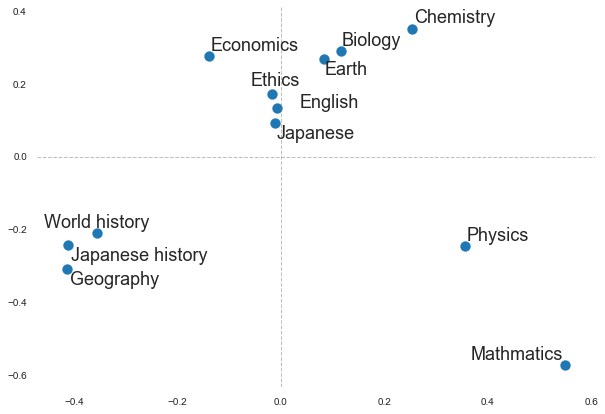

In [11]:
plt.figure(figsize=(10,7))
plt.scatter(df_qualitification['qv_1'], df_qualitification['qv_2'], s=100)
texts = [plt.text(df_qualitification['qv_1'][i], df_qualitification['qv_2'][i], mapper_ja2en[df_qualitification.index[i]], fontsize=18, ha='center', va='center') for i in range(len(df_qualitification))]
adjust_text(texts)

plt.axhline(y=0, color='gray', alpha=0.5, linewidth=1, linestyle='--')
plt.axvline(x=0, color='gray', alpha=0.5, linewidth=1, linestyle='--')

print("visualiztion of items")